# Рынок заведений общественного питания Москвы

# Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**Цель иследования:** Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Задачи исследования:**
1) Исследовать рынок объектов общественного питания Москвы.<br>
2) Проанализировать результаты исследования и сделать выводы.<br>
3) Подготовить презентацию с результатами исследования и рекомендациями.<br>

## Изучение общей информации и выгрузка данных

До начала исследования необходимо изучить и подготовить данные к работе.<br>
Импортируем все необходимые для работы библиотеки.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from plotly import graph_objects as go 
import plotly.express as px
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import warnings
warnings.filterwarnings("ignore")

In [2]:
plt.style.use('ggplot')
sns.set_palette('Paired') 

Откроем файл и запишем его в переменную `data`.<br>
Выведем первые 10 строк датафрейма.

In [3]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

In [4]:
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


**Описание данных**

Файл `moscow_places.csv`:
 - `name` — название заведения;
 - `address` — адрес заведения;
 - `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 - `hours` — информация о днях и часах работы;
 - `lat` — широта географической точки, в которой находится заведение;
 - `lng` — долгота географической точки, в которой находится заведение;
 - `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — `5.0`);
 - `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 - `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    * «Средний счёт: 1000–1500 ₽»;
    * «Цена чашки капучино: 130–220 ₽»;
    * «Цена бокала пива: 400–600 ₽».
       и так далее;
 - `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
   * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
 - `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:
   * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
 - `chain` — число, выраженное `0` или `1`, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
   * 0 — заведение не является сетевым
   * 1 — заведение является сетевым
 - `district` — административный район, в котором находится заведение, например Центральный административный округ;
 - `seats` — количество посадочных мест.

Выводим основную информацию о датафрейме data.

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датафрейме представлены сведения о 8406 заведениях общественного питания Москвы.<br>
Столбец `seats` содержит данные о количестве посадочных мест в виде float, что, очевидно, является ошибкой, т.к. должно быть int. В остальных столбцах формат соответсвует данным. В некоторых столбцах присутствуют пропуски.

## Предобработка данных

Приведём названия заведений в столбце name к нижнему регистру.

In [6]:
data['name'] = data['name'].str.lower()

Посмотрим количество дубликатов

In [7]:
data.duplicated().sum()

0

На первый взгляд дубликатов нет. Проверим датафрейм data на наличие дубликатов по совокупности полей `name` и `address`.

In [8]:
data.duplicated(subset=['name', 'address']).sum()

3

In [9]:
data.loc[data.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Явным дубликатом выглядит вторая строка с данными ресторана "More Poke". Вторые строки для заведений "Раковарня клешни и хвосты" и "Хлеб да выпечка" содержат разные категории заведений и немного разные координаты, но так как адрес у них один, будем считать это дубликатами и удалим дублирующие строки.

In [10]:
data.drop_duplicates(subset=['name', 'address'], keep='first', inplace=True)

In [11]:
data.duplicated(subset=['name', 'address']).sum()

0

Посмотрим пропущенные значения.

In [12]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

Во всех заведениях известно наименование, категория, метоположение, рейтинг и является ли заведение сетевым. Однако не все заведения указывают часы работы, количество мест и цены в своих заведениях.

Явных дубликатов оказалось не много, однако присутствуют множественные пропуски. Обработать большую часть их них, к сожаленю,  невозможно. Рабочие часы и количество мест зависит от помещения и внутреннего устава компаний. Столбцы `middle_avg_bill` и `middle_coffee_cup` не могут быть заполнены, так как у нас не хватает статистических данных. Также многие компании могли не заполнять столбец `middle_coffee_cup`, так как не являются кофейнями. Столбец `price` так же следует оставить, так как среди высоких цен может быть средний чек от 700, среди категорий выше среднего могут быть средние счета в 250-500 рублей и так далее. Из-за этих пересечений нельзя утверждать, что по среднему счёту можно сразу определить категорию.

Заполним пропуски.<br>
Наибольшее количество пропусков у нас в столбце `middle_coffee_cup`. Больше половины данных составляют пропуски в столбцах `middle_avg_bill`, `price` и `avg_bill`, меньше половины - в столбце `seats`. Немного пропусков содержит столбец `hours`.

Пропуски в столбцах `avg_bill`, `price` и `hours` заменим строкой 'н/д', это позволит избежать проблем, связанных с непреднамеренным включением пустых ячеек в вычисления.

In [13]:
data['avg_bill'] = data['avg_bill'].fillna('н/д')

In [14]:
data['price'] = data['price'].fillna('н/д')

In [15]:
data['hours'] = data['hours'].fillna('н/д')

Столбец `middle_avg_bill` содержит число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт». Если значения в столбце `avg_bill` нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

Заполним пропуски в столбце `middle_avg_bill` заглушкой "0".

In [16]:
data['middle_avg_bill'] = data['middle_avg_bill'].fillna(0)

Столбец `middle_coffee_cup` содержит число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена чашки капучино». Если значения в столбце `avg_bill` нет или оно не начинается с подстроки «Цена чашки капучино», то в столбец ничего не войдёт.

Заполним пропуски в столбце `middle_coffee_cup` заглушкой "0".

In [17]:
data['middle_coffee_cup'] = data['middle_coffee_cup'].fillna(0)

Заменим пропуски в столбце `seats` заглушкой "-1".

In [18]:
data['seats'] = data['seats'].fillna(-1)

Проверим обработку пропусков

In [19]:
data.isna().sum()

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

**Изменение типов данных**

Изменим типы данных в столбцах `middle_avg_bill`,`middle_coffee_cupна` и `seats` на int.

In [20]:
data['middle_avg_bill'] = data['middle_avg_bill'].astype('int')

In [21]:
data['middle_coffee_cup'] = data['middle_coffee_cup'].astype('int')

In [22]:
data['seats'] = data['seats'].astype('int')

Проверим корректность замены типов данных.

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8403 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              8403 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              8403 non-null   object 
 9   avg_bill           8403 non-null   object 
 10  middle_avg_bill    8403 non-null   int32  
 11  middle_coffee_cup  8403 non-null   int32  
 12  chain              8403 non-null   int64  
 13  seats              8403 non-null   int32  
dtypes: float64(3), int32(3), int64(1), object(7)
memory usage: 886.3+ KB


Для удобства заменим значения в столбце `chain`: 0 - не сетевые, 1 - сетевые. 

In [24]:
def category_chain(ch):
    if ch==0:
        return 'несетевые'
    elif ch==1:
        return 'сетевые'    
    else:
        return 'UnknownGroup'

data['chain'] = data['chain'].apply(category_chain)
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,н/д,н/д,0,0,несетевые,-1
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,0,несетевые,4
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,0,несетевые,45
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,н/д,Цена чашки капучино:155–185 ₽,0,170,несетевые,-1
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,0,сетевые,148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,н/д,н/д,0,0,несетевые,86
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,н/д,н/д,0,0,несетевые,150
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,н/д,Средний счёт:от 150 ₽,150,0,несетевые,150
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,н/д,н/д,0,0,сетевые,150


**Для дальнейшей работы создадим несколько столцов:**

Добавим в таблицу столбец с названими улиц `street` и столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно

In [25]:
data['street'] = data['address'].apply(lambda x: x.split(sep=', ')[1])

In [26]:
data['is_24/7'] = data[data['hours'].apply(lambda x: 'ежедневно, круглосуточно' in str(x))]['hours'] == 'ежедневно, круглосуточно'
data['is_24/7'] = data['is_24/7'].fillna(False)

In [27]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,н/д,н/д,0,0,несетевые,-1,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,0,несетевые,4,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,0,несетевые,45,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,н/д,Цена чашки капучино:155–185 ₽,0,170,несетевые,-1,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,0,сетевые,148,Правобережная улица,False


### Выбросы и анамалии

**Посмотрим на количество посадочных мест на ящике с усами.**

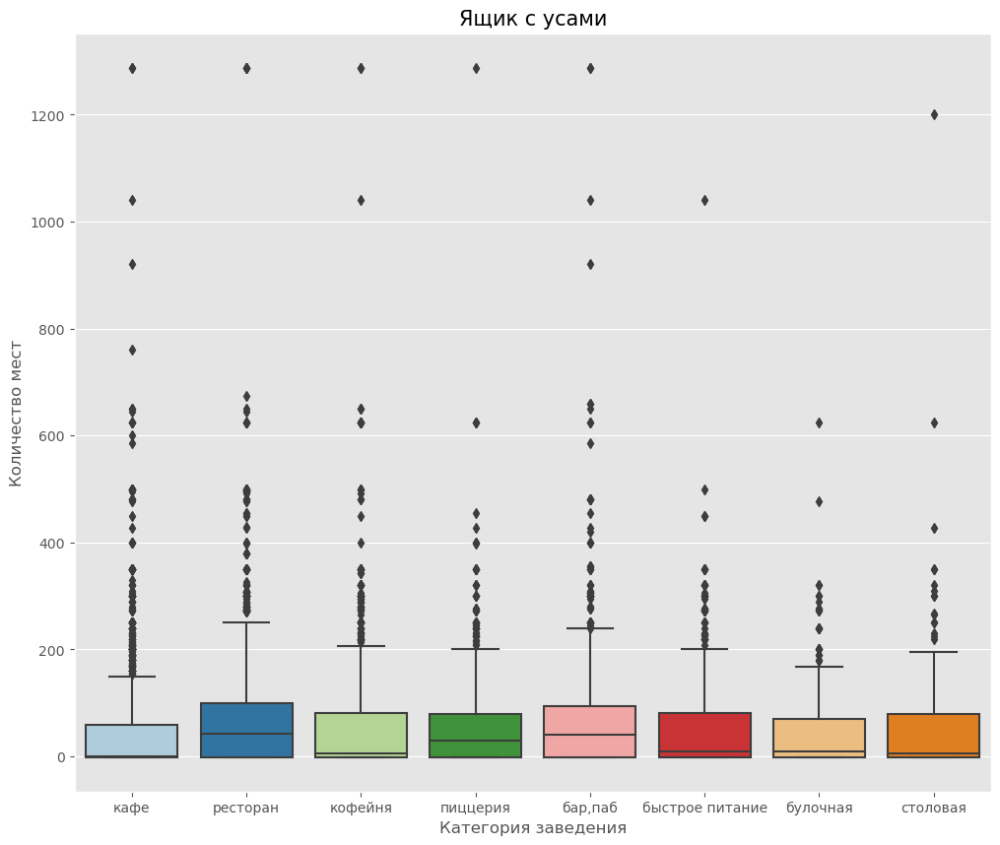

In [28]:
plt.figure(figsize=(12,10))
sns.boxplot(data=data, x='category', y='seats')
plt.title('Ящик с усами', fontsize=15)
plt.xlabel('Категория заведения', fontsize=12)
plt.ylabel('Количество мест',fontsize=12);

Если ориентироваться на площадь предназначенную для одного посадочного места, то она составляет для кафе 1,6 квадратных метра и 1,8, если идет речь о солидном ресторане. Так как у нас нет данных о площади заведений, предположу что все что выше 400 посадочных мест это уже выбросы и следует сделать фильтрацию данных.

Посмотрим, сколько всего таких мест и оценим процент от общего числа. Ограничим значения снизу значением `-1` (это наша заглушка с пропусками), 400 мест сверху. В рамках нашего иследования, возьмем максимальное количество мест 400, все что выше будем считать анамалиями.

In [29]:
print(len(data.query('seats < -1 or seats > 400')))
print((len(data.query('seats < -1 or seats > 400')) / len(data))*100)

121
1.4399619183624894


Если мы уберём эти значения, потеряем 1,4% начальных данных, что допустимо. Применим метод query. Введём переменную data_filt, в которой далее будем хранить отфильтрованные данные. Обновлять её будем последовательно с каждой итерацией, чтобы не создавать излишнее количество переменных.

In [30]:
data_filt = data.query('-1 <= seats <= 400')

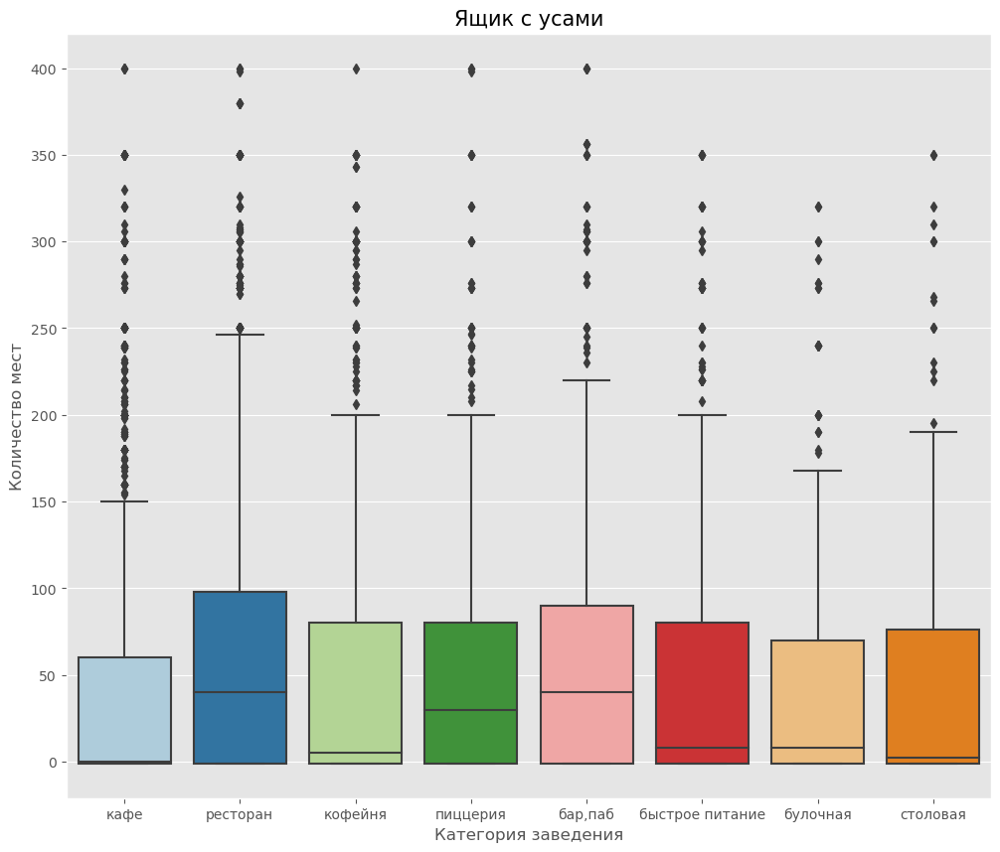

In [31]:
plt.figure(figsize=(12,10))
sns.boxplot(data=data_filt, x='category', y='seats')
plt.title('Ящик с усами', fontsize=15)
plt.xlabel('Категория заведения', fontsize=12)
plt.ylabel('Количество мест',fontsize=12);

In [32]:
# check
data_filt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8282 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8282 non-null   object 
 1   category           8282 non-null   object 
 2   address            8282 non-null   object 
 3   district           8282 non-null   object 
 4   hours              8282 non-null   object 
 5   lat                8282 non-null   float64
 6   lng                8282 non-null   float64
 7   rating             8282 non-null   float64
 8   price              8282 non-null   object 
 9   avg_bill           8282 non-null   object 
 10  middle_avg_bill    8282 non-null   int32  
 11  middle_coffee_cup  8282 non-null   int32  
 12  chain              8282 non-null   object 
 13  seats              8282 non-null   int32  
 14  street             8282 non-null   object 
 15  is_24/7            8282 non-null   bool   
dtypes: bool(1), float64(3), 

**Число с оценкой среднего чека**

In [33]:
data_filt.groupby('category')['middle_avg_bill'].describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",746.0,607.390080,898.331478,0.0,0.0,0.0,1100.0,11000.0
булочная,254.0,133.523622,378.051335,0.0,0.0,0.0,0.0,2500.0
быстрое питание,599.0,175.535893,359.949595,0.0,0.0,0.0,300.0,5500.0
кафе,2347.0,205.552194,420.192616,0.0,0.0,0.0,275.0,4500.0
кофейня,1394.0,86.113343,284.682350,0.0,0.0,0.0,0.0,2500.0
пиццерия,627.0,489.917065,559.740980,0.0,0.0,400.0,750.0,3000.0
ресторан,2003.0,695.854718,1226.037804,0.0,0.0,250.0,1250.0,35000.0
столовая,312.0,182.525641,187.674564,0.0,0.0,240.0,300.0,1250.0


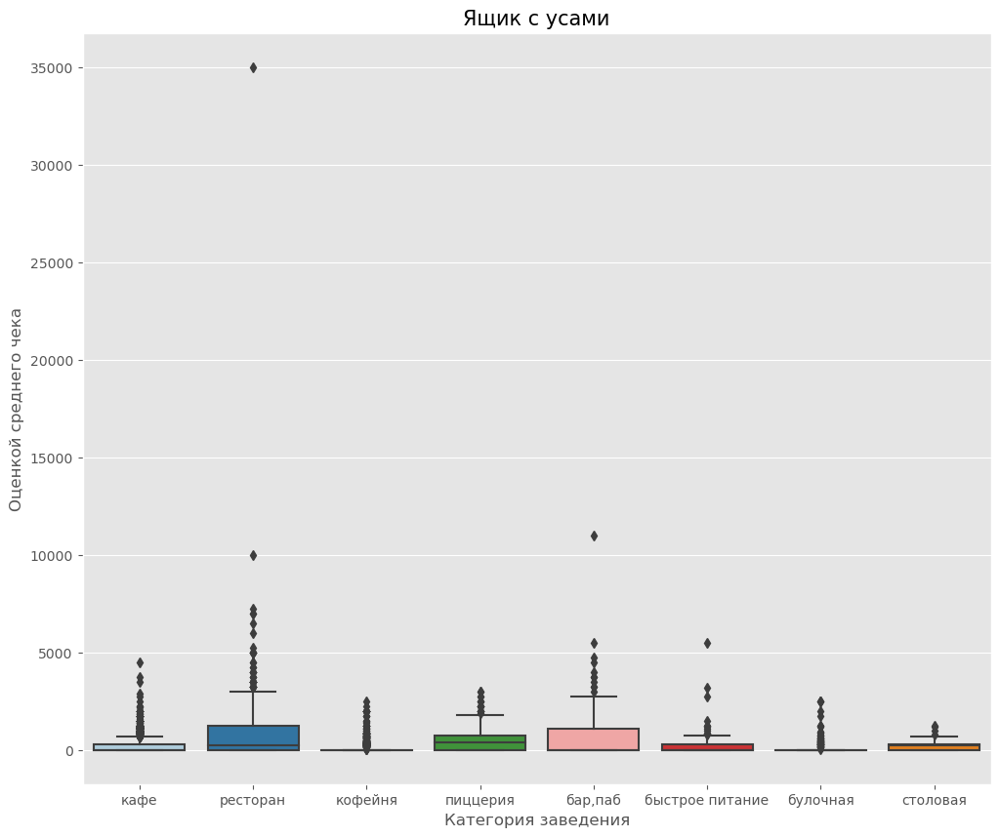

In [34]:
plt.figure(figsize=(12,10))
sns.boxplot(data=data_filt, x='category', y='middle_avg_bill')
plt.title('Ящик с усами', fontsize=15)
plt.xlabel('Категория заведения', fontsize=12)
plt.ylabel('Оценкой среднего чека',fontsize=12);

Оставим все как есть, в ресторане и в пабе вполне возможно оставить такие суммы.

**Число с оценкой одной чашки капучино**

In [35]:
data_filt.groupby('category')['middle_coffee_cup'].describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",746.0,1.675603,18.844311,0.0,0.0,0.0,0.0,250.0
булочная,254.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
быстрое питание,599.0,0.233723,5.720245,0.0,0.0,0.0,0.0,140.0
кафе,2347.0,0.179804,4.419312,0.0,0.0,0.0,0.0,125.0
кофейня,1394.0,64.596844,100.685866,0.0,0.0,0.0,135.0,1568.0
пиццерия,627.0,0.733652,10.594359,0.0,0.0,0.0,0.0,160.0
ресторан,2003.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
столовая,312.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0


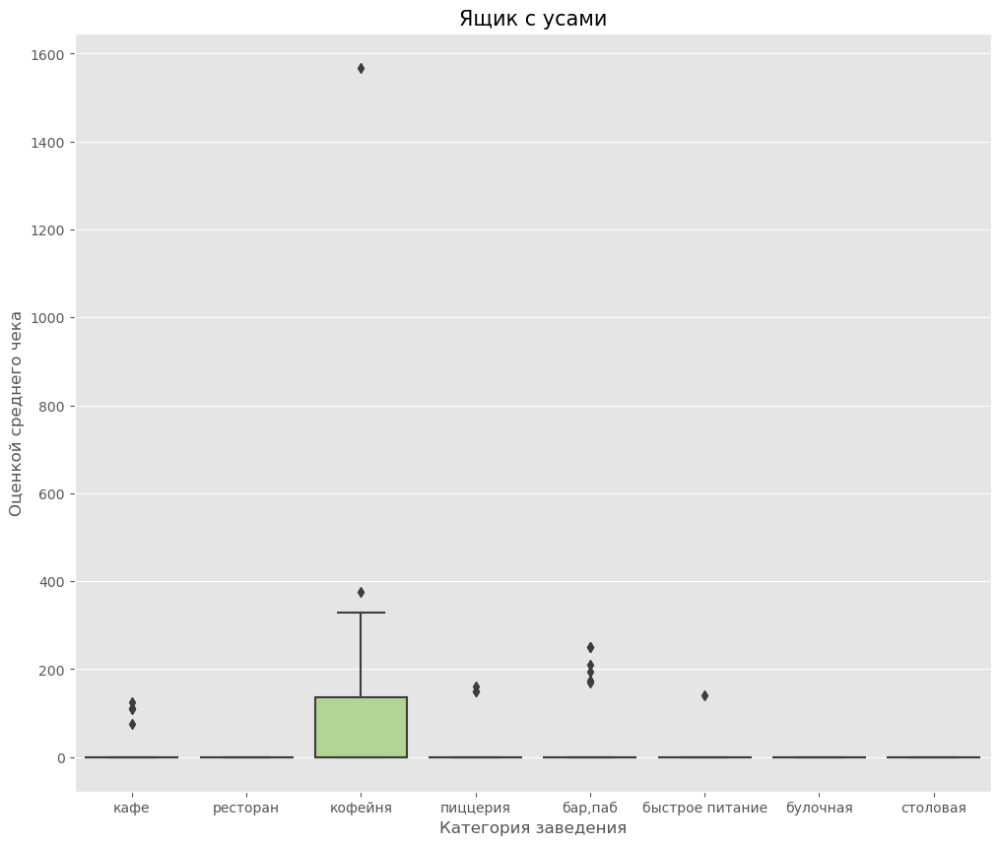

In [36]:
plt.figure(figsize=(12,10))
sns.boxplot(data=data_filt, x='category', y='middle_coffee_cup')
plt.title('Ящик с усами', fontsize=15)
plt.xlabel('Категория заведения', fontsize=12)
plt.ylabel('Оценкой среднего чека',fontsize=12);

Что это за кофейня такая где кружка кофе стоит почти 1600. Посмотрим процент потерь и уберем эту анамалию. Ограничим значения снизу значением 0 (это наша заглушка с пропусками), 350 рублей за чашку кофе.

In [37]:
print(len(data_filt.query('middle_coffee_cup < 0 or middle_coffee_cup > 350')))
print((len(data_filt.query('middle_coffee_cup < 0 or middle_coffee_cup > 350')) / len(data))*100)

2
0.02380102344400809


Процент потерь не значительный.

In [38]:
data_filt = data.query('0 <= middle_coffee_cup <= 350')

Итак, в ходе данного раздела мы посмотрели структуру данных, убрали дубликаты, посмотрели пропуски и заменили их. Были устранены выбросы и анамалии в данных. Также были добавлены столбцы с улицей и информацией о том, является ли заведение круглосуточным.

## Анализ данных

### Количество объектов общественного питания по категориям

Посмотрим какие категории заведений и их количество у нас есть в датасете.

In [39]:
categories = data_filt.groupby('category') \
                 .agg(count=('category', 'count')) \
                 .sort_values(by='count', ascending=False) \
                 .reset_index()
categories

,category,count
0,кафе,2377
1,ресторан,2042
2,кофейня,1411
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [40]:
fig = px.bar(categories, 
             x='category', 
             y='count', 
             color='category')
fig.update_layout(title='Количество объектов общественного питания Москвы по категориям',
                  xaxis_title='Категория',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show()

In [41]:
# fig = go.Figure(data=[go.Pie(labels=categories['category'], values=categories['count'], pull=[0.2, 0.1, 0.05])])
# fig.update_layout(title='Количество объектов общественного питания Москвы по категориям', 
                  # width=800, 
                  # height=500,
                  # annotations=[dict(x=1.16, 
                                   # y=1.05,
                                   # text='Категория',
                                   # showarrow=False)])

У нас 8 категорий заведений на территории Москвы. Больше всего объектов общественного питания категории `кафе`. Далее идут `рестораны`. И на третьем месте `кофейни`.

### Количество посадочных мест в объектах общественного питания по категориям

In [42]:
data_filt.pivot_table(index='category', values='seats', aggfunc=['mean', 'median'])

,mean,median
,seats,seats
category,,
"бар,паб",75.698953,40.0
булочная,51.253906,9.0
быстрое питание,56.814262,10.0
кафе,49.362221,0.0
кофейня,58.547838,6.0
пиццерия,63.418641,30.0
ресторан,75.371205,42.5
столовая,51.453968,6.0


Можно заметить, что среднее и медианные значения достаточно сильно отличаются.

In [43]:
seats = data_filt.query('seats != -1') \
            .groupby('category') \
            .agg(seats_median=('seats', 'median')) \
            .sort_values(by='seats_median', ascending=False) \
            .reset_index()
seats['seats_median'] = seats['seats_median'].astype('int')

In [44]:
# строим столбчатую диаграмму 
fig = px.bar(seats.sort_values(by='seats_median', ascending=True),
             x='seats_median', 
             y='category',              
             text='seats_median'     
            )

fig.update_layout(title='Количество посадочных мест в объектах общественного питания по категориям',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Категория объекта общественного питания')
fig.show()

Наибольшее медианное количество посадочных мест - в ресторанах, барах и кофейнях, а так же столовых. Меньше посадочных мест в заведениях быстрого питания, кафе и пиццериях, а меньше всего - в булочных.

### Соотношение сетевых и не сетевых заведений

Построим круговую диаграмму на которой будет видно соотношение сетевых и несетевых заведений общественного пистания.

In [45]:
chain_category = ['сетевые', 'несетевые']

In [46]:
values = [len(data_filt.query('chain == "сетевые"')), len(data.query('chain == "несетевые"'))]

In [47]:
fig = go.Figure(data=[go.Pie(labels=chain_category, values=values)])
fig.update_layout(title='Cоотношение сетевых и несетевых заведений общественного питания', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.15, 
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() 

Получается, что у нас больше несетевых заведений 62% и всего 38% сетевых. 

### Категории сетевых заведений общественного питания

Посмотрим в сводной таблице распределение несетевых и сетевых заведений. 

In [48]:
data_types_chain = data_filt.pivot_table(index='category',
                                         columns='chain',
                                         values = 'seats',
                                         aggfunc = 'count'
                                        )
data_types_chain

chain,несетевые,сетевые
category,,
"бар,паб",596,168
булочная,99,157
быстрое питание,371,232
кафе,1598,779
кофейня,692,719
пиццерия,303,330
ресторан,1313,729
столовая,227,88


Визуализируем распределение сетевых и несетевых заведений общественного питания по категориям, используя столбчатый график.

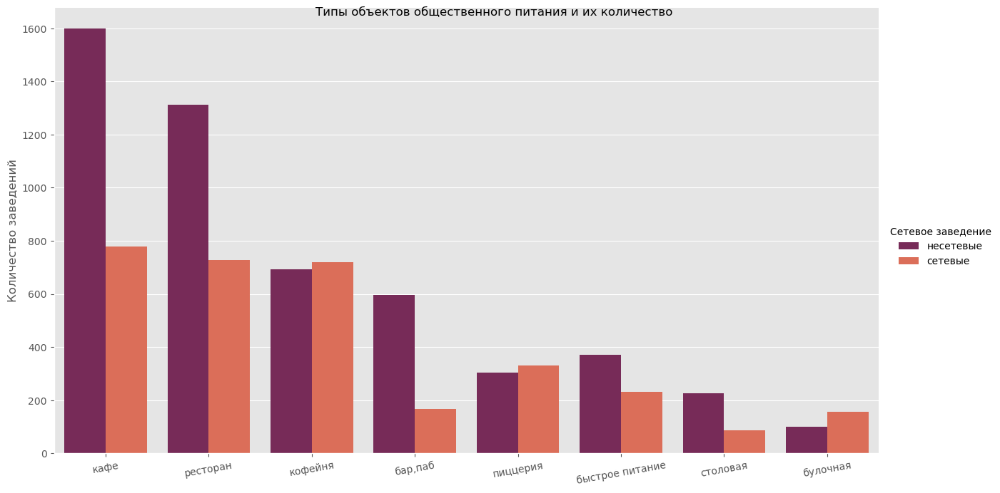

In [49]:
ax = sns.catplot(x='category', 
                 kind='count',
                 orient="h",
                 palette="rocket",
                 height=7,
                 data=data_filt,
                 aspect=1.8,
                order=data_filt['category'].value_counts().index, hue='chain', legend = False)
ax.set_axis_labels("", "Количество заведений")
ax.set_xticklabels(rotation=10)
ax.add_legend(title='Сетевое заведение')
ax.fig.suptitle('Типы объектов общественного питания и их количество')

sns.despine()

Сетевые заведения встречаются во всех категориях. Кафе и рестораны примерно в 2 раза чаще являются несетевыми. Небольшое превышение количества сетевых заведений над несетевыми присутствует только у кофеен, пиццерий и булочных. Реже всего сетевыми бывают бары и пабы.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Верно, булочная и пиццерия в ТОП по кол-ву сетевых заведений
</div>

### Топ популярных сетей общественного питания

Определим топ 15 заведений общественного питания в Москве. Определять будем среди сетевых заведений.<br>
Сгрупируем заведения по назваеию и выведим 15 самых популярных.

In [50]:
top_15_chain = data_filt.query('chain == "сетевые"') \
                   .groupby('name') \
                   .agg(count=('name', 'count')) \
                   .sort_values(by='count', ascending=False) \
                   .reset_index() \
                   .head(15)

Визуализируем на столбчатой диаграмме

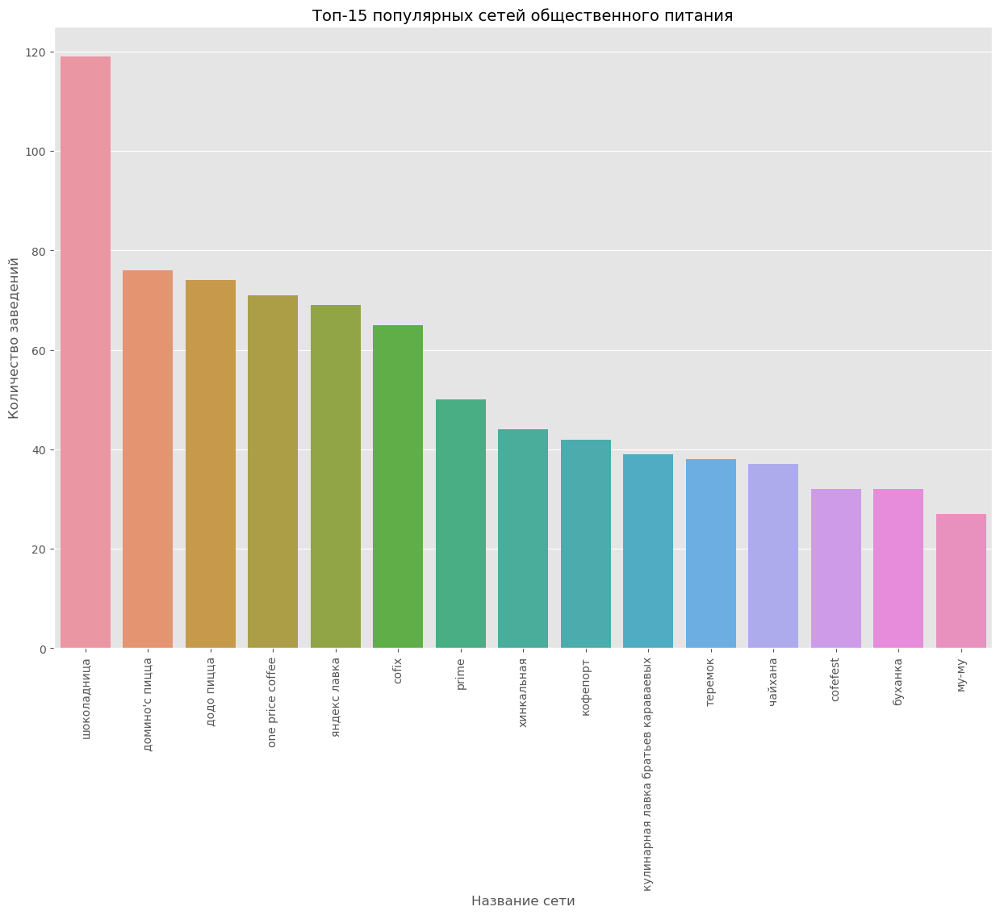

In [51]:
plt.figure(figsize=(15, 10))
sns.barplot(x='name', 
            y='count', 
            data=top_15_chain) 
plt.title('Топ-15 популярных сетей общественного питания', fontsize=14)
plt.xlabel('Название сети', fontsize=12)
plt.ylabel('Количество заведений', fontsize=12)
plt.xticks(rotation=90)

plt.show()

Самая распространенная сеть общественного питания в Москве это кофейня "Шоколадница". Второе и третье место у пицерий "Домино'с Пицца" и "Додо Пицца". Четвертое и шестое место у кофейни "One Price Coffee" и "Cofix". На пятом расположилась "Яндекс Лавка".

Создадим переменную с названиями попульрных сетей.

In [52]:
top_15_chain_names = top_15_chain['name']

Посчитаем количество заведений, для этого сгруппируем данные по категории и названию. 

In [53]:
top_15_chain_category = data_filt.query('chain == "сетевые" and name in @top_15_chain_names') \
                            .groupby(['category', 'name']) \
                            .agg(count=('name', 'count')) \
                            .reset_index() 
top_15_chain_category

,category,name,count
0,"бар,паб",му-му,1
1,"бар,паб",хинкальная,3
2,булочная,буханка,25
3,быстрое питание,му-му,2
4,быстрое питание,теремок,2
5,быстрое питание,хинкальная,6
6,быстрое питание,чайхана,2
7,кафе,cofefest,1
8,кафе,prime,1
9,кафе,буханка,1


In [54]:
fig = px.bar(top_15_chain_category, 
             x='category', 
             y='count', 
             color='name')
fig.update_layout(title='Количество заведений из популярных сетей по категориям',
                  xaxis_title='Категория',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show()

Из графика видно, что наибольшее число сетевых заведений состаяляют кофейни, рестораны, пиццерии и кафе.<br>
- Среди кофейн аиболее популярна "Шоколадница"
- Среди ресторанов - "Яндекс Лавка" 
- Среди пиццерии "Додо пицца" и "Домино'с пицца"
- Среди кафе популярное заведение - "Кулинарная лавка братьев Караваевых"

### Заведения общественного питания в районах Москвы 

Посмотрим на категории заведений по районам и их количество 

In [55]:
data_types_chain = data_filt.pivot_table(index='category',
                                         columns='district',
                                         values = 'name',
                                         aggfunc = 'count'
                                        )
data_types_chain

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
category,,,,,,,,,
"бар,паб",53,50,68,62,23,364,38,38,68
булочная,25,37,39,28,12,50,13,27,25
быстрое питание,71,62,58,82,30,87,67,61,85
кафе,272,238,235,269,115,464,282,238,264
кофейня,104,150,193,159,62,428,88,96,131
пиццерия,72,71,77,68,40,113,55,64,73
ресторан,160,218,188,182,109,670,145,168,202
столовая,40,24,41,40,18,66,25,17,44


Сгруппируем данные по району и категории, чтобы посчитать количество заведений в каждой категории по районам.

In [56]:
district_filt = data_filt.groupby(['district', 'category']) \
                        .agg(count=('name', 'count')) \
                        .sort_values(by='count', ascending=False) \
                        .reset_index() 
district_filt

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


Визуализируем распределение общего количества заведений и количества заведений каждой категории по районам.

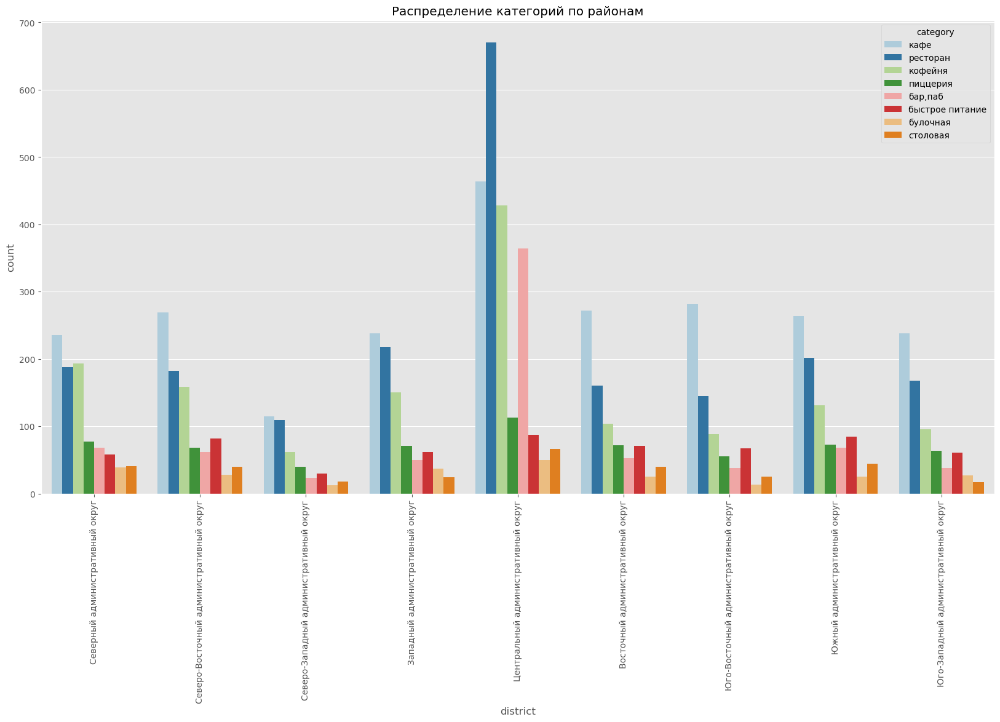

In [57]:
plt.figure(figsize=(20, 10))
sns.countplot(x='district', hue='category', data=data_filt)
plt.xticks(rotation=90)
plt.title('Распределение категорий по районам')
plt.show()

Больше всего заведений общественного питания находится в Центральном административном округе. Более чем в 2-3 раза меньше заведений в других округах. Меньше всего заведений в Северо-Западном округе.<br>
В Центральном администативном округе большую часть заведений составляют рестораны, затем следуют кафе, кофейни и бары. В других округах большую часть заведений составляют кафе.

### Распределение средних рейтингов по категориям заведений

Сгруппируем данные по категориям и получим среднее значения рейтинга.

In [58]:
category_ratings = data_filt.groupby('category') \
                       .agg(median_rating=('rating', 'mean')) \
                       .sort_values(by='median_rating', ascending=False) \
                       .reset_index()
category_ratings

,category,median_rating
0,"бар,паб",4.387696
1,пиццерия,4.301264
2,ресторан,4.290402
3,кофейня,4.277321
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123896
7,быстрое питание,4.050249


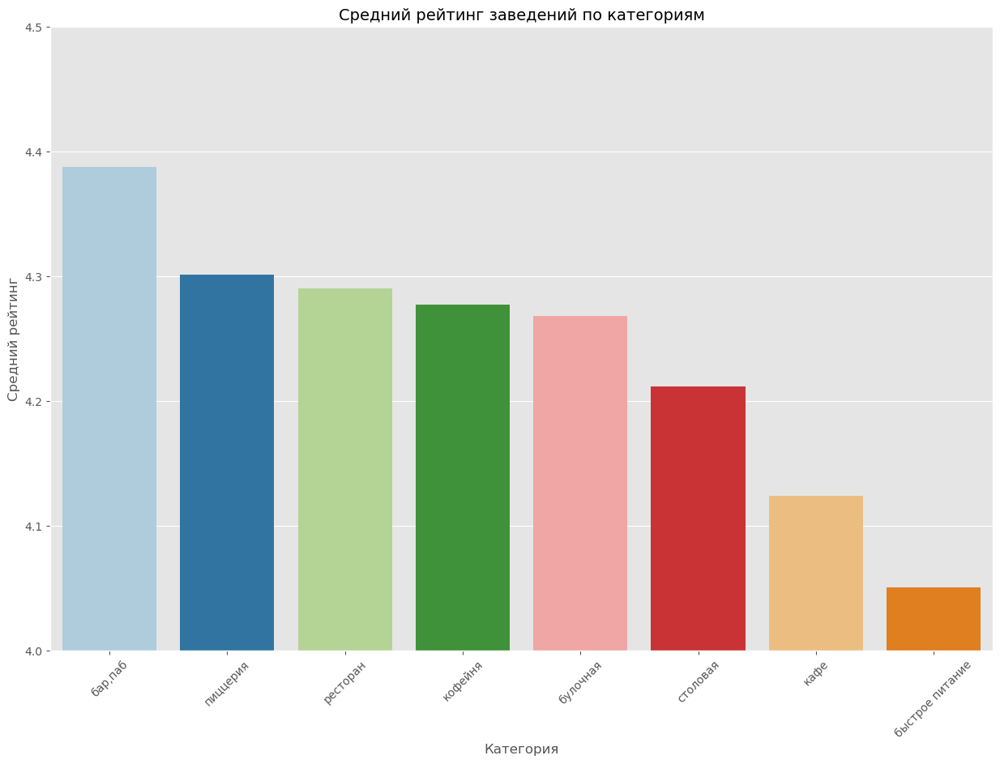

In [59]:
plt.figure(figsize=(15, 10))
sns.barplot(x='category',
            y='median_rating',
            data=category_ratings
           )
plt.title('Средний рейтинг заведений по категориям', fontsize=14)
plt.xlabel('Категория', fontsize=12)
plt.ylabel('Средний рейтинг', fontsize=12)
plt.ylim(4, 4.5)
plt.xticks(rotation=45)
plt.show()

Сильнее всех выделяется усредненый рейтинг баров и пабов он составляет почти 4.4. Далее практически одинаковый рейтинг у пиццерий, ресторанов, кофеен и булочных - оценка 4.3. У столовых рейтинг ниже - оценка 4.2. Немного ниже усредненый рейтинг у заведений кафе - 4.1 и быстрого питания - 4.0.

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

Для каждого округа посчитаем медианный рейтинг заведений общественного питания, которые находятся на его территории:

In [60]:
district_ratings = data_filt.groupby('district',
                                     as_index=False)['rating'] \
                                     .agg('median') \
                                     .sort_values(by='rating', ascending=False)
district_ratings

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [61]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [62]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_ratings,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Отображение всех заведений датасета на карте с помощью кластеров

In [63]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

Определим топ-15 улиц по количеству заведений.

In [64]:
top_15_streets = data.groupby('street') \
                    .agg(count=('name', 'count')) \
                    .sort_values(by='count', ascending=False) \
                    .reset_index() \
                    .head(15)['street']
top_15_streets

0              проспект Мира
1          Профсоюзная улица
2       проспект Вернадского
3         Ленинский проспект
4     Ленинградский проспект
5          Дмитровское шоссе
6            Каширское шоссе
7           Варшавское шоссе
8        Ленинградское шоссе
9                       МКАД
10          Люблинская улица
11            улица Вавилова
12      Кутузовский проспект
13      улица Миклухо-Маклая
14           Пятницкая улица
Name: street, dtype: object

In [65]:
top_15_streets_category = data_filt.query('street in @top_15_streets') \
                              .groupby(['street', 'category']) \
                              .agg(count=('name', 'count')) \
                              .sort_values(by='count', ascending=False) \
                              .reset_index()
top_15_streets_category

,street,category,count
0,проспект Мира,кафе,53
1,МКАД,кафе,45
2,проспект Мира,ресторан,45
3,проспект Мира,кофейня,36
4,Профсоюзная улица,кафе,35
...,...,...,...
106,Люблинская улица,пиццерия,1
107,проспект Вернадского,булочная,1
108,Кутузовский проспект,булочная,1
109,МКАД,столовая,1


In [66]:
for s in top_15_streets_category['street'].unique():
    top_15_streets_category.loc[(top_15_streets_category['street'] == s), 'total_count']  = \
    top_15_streets_category.loc[(top_15_streets_category['street'] == s), 'count'].sum()

In [67]:
fig = px.bar(top_15_streets_category.sort_values(by='total_count', ascending=False), 
             x='street', 
             y='count', 
             color='category')
fig.update_layout(title='Количество заведений каждой категории по улицам',
                  xaxis_title='Улица',
                  yaxis_title='Количество заведений')
fig.show()

Больше всего заведений находится на проспекте Мира. Из них большую часть составляют кафе - 53 и рестораны - 45, затем идут кофейни - 36. Много заведений находится на Профсоюзной улице, проспекте Вернадского, Ленинском и Ленинградском проспектах. Большую часть заведений на популярных улицах составляют преимущественно кафе и рестораны примерно в равных долях. На третьем месте следуют кофейни. Только на МКАД значительную долю заведений составляют кафе.

### Улицы, на которых находится только один объект общепита

Посмотрим улицы, на которых находится всего один объект опщепита.

In [68]:
one_rest = data_filt.groupby('street') \
                            .agg(count=('name', 'count')) \
                            .sort_values(by='count', ascending=False) \
                            .reset_index() \
                            .query('count == 1')['street']

In [69]:
data_one_rest = data_filt.query('street in @one_rest')

In [70]:
data_one_rest.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400,0,несетевые,180,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,н/д,н/д,0,0,несетевые,-1,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,н/д,н/д,0,0,сетевые,-1,парк Левобережный,False
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650,0,сетевые,-1,Угличская улица,False
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,н/д,н/д,0,0,сетевые,-1,ландшафтный заказник Лианозовский,False


In [71]:
categories_one_rest = data_one_rest.groupby('category') \
                                   .agg(count=('name', 'count')) \
                                   .sort_values(by='count', ascending=False) \
                                   .reset_index()
categories_one_rest

,category,count
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


In [72]:
fig = px.bar(categories_one_rest, 
             x='category', 
             y='count',
            color='category')
fig.update_layout(title='Количество единственных на улице объектов общественного питания по категориям',
                  xaxis_title='Категория',
                  yaxis_title='Количество заведений')
fig.show()

In [73]:
# fig = go.Figure(data=[go.Pie(labels=categories_one_rest['category'], values=categories_one_rest['count'], pull=[0.2, 0.1, 0.05])])
# fig.update_layout(title='Количество единственных на улице объектов общественного питания по категориям', 
                 # width=800, 
                 # height=500,
                 # annotations=[dict(x=1.17, 
                                   # y=1.05,
                                   # text='Категория',
                                   # showarrow=False)])

Больше всего у нас получается единичных кафе, далее рестораны, кофейни и уже гораздо меньше баров и столовых.

Сгруппируем данные по району и категории

In [74]:
district_one_rest = data_one_rest.groupby(['district', 'category']) \
                                     .agg(count=('name', 'count')) \
                                     .sort_values(by='count', ascending=False) \
                                     .reset_index() 

In [75]:
for d in district_one_rest['district'].unique():
    district_one_rest.loc[(district_one_rest['district'] == d), 'total_count']  = \
    district_one_rest.loc[(district_one_rest['district'] == d), 'count'].sum()

In [76]:
fig = px.bar(district_one_rest.sort_values(by='total_count', ascending=False), 
             x='district', 
             y='count', 
             color='category')
fig.update_layout(title='Количество единственных на улице заведений каждой категории по районам',
                  xaxis_title='Район',
                  yaxis_title='Количество заведений')
fig.show()

В ЦАО находится больше часть единственных объектов общепита. Почти равные доли у кафе (38), у ресторанов(36) и у кофеин(34).

### Средний чек заведений общественного питания

In [77]:
district_median_middle_avg_bill = data_filt.query('middle_avg_bill != 0') \
                                      .groupby('district') \
                                      .agg(median_middle_avg_bill=('middle_avg_bill', 'median')) \
                                      .sort_values(by='median_middle_avg_bill', ascending=False) \
                                      .reset_index()
district_median_middle_avg_bill

,district,median_middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [78]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_median_middle_avg_bill,
    columns=['district', 'median_middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Самые высокие средние чеки - в заведениях общественного питания ЦАО и ЗАО (1000 руб.), самый низкий - в ЮВАО (450 руб.). В остальных округах средние чеки составляют от 500 до 700 руб. Таким образом, удалённость от центра влияет на величину среднего чека не во всех округах Москвы.

### Общий вывод

**Общий вывод по разделу - Анализ данных:**
* У нас 8 категорий заведений общественного питания на территории Москвы. 
* Больше всего объектов общественного питания категории кафе (28.3 %). Далее идут рестораны (24.3%). И на третьем месте кофейни (16.8%).
* Наибольшее медианное количество посадочных мест - в ресторанах, барах и кофейнях, а так же столовых.
* В Москве больше несетевых заведений общественного питания 62% и всего 38% сетевых.
* Кафе и рестораны примерно в 2 раза чаще являются несетевыми.
* Небольшое превышение количества сетевых заведений над несетевыми присутствует только у кофеен, пиццерий и булочных. 
* Самая распространенные сети общественного питания в Москве: 
   - Среди кофейн аиболее популярна "Шоколадница"
   - Среди ресторанов - "Яндекс Лавка"
   - Среди пиццерии "Додо пицца" и "Домино'с пицца"
   - Среди кафе популярное заведение - "Кулинарная лавка братьев Караваевых"
* Больше всего заведений общественного питания находится в Центральном административном округе. Более чем в 2-3 раза меньше заведений в других округах. Меньше всего заведений в Северо-Западном округе.
* В Центральном администативном округе большую часть заведений составляют рестораны, затем следуют кафе, кофейни и бары. В других округах большую часть заведений составляют кафе.
* Сильнее всех выделяется усредненый рейтинг баров и пабов он составляет почти 4.4. Далее практически одинаковый рейтинг у пиццерий, ресторанов, кофеен и булочных - оценка 4.3. У столовых рейтинг ниже - оценка 4.2. Немного ниже усредненый рейтинг у заведений кафе - 4.1 и быстрого питания - 4.0.
* Больше всего заведений находится на проспекте Мира. Из них большую часть составляют кафе - 53 и рестораны - 45, затем идут кофейни - 36.
* В ЦАО находится больше часть единственных объектов общепита. 
* Самые высокие средние чеки - в заведениях общественного питания ЦАО и ЗАО (1000 руб.), самый низкий - в ЮВАО (450 руб.). В остальных округах средние чеки составляют от 500 до 700 руб. Таким образом, удалённость от центра влияет на величину среднего чека не во всех округах Москвы. 

## Исследование для открытия кофейни

### Общее количество кофеен и их распределение по районам

Отберём в датафрейме data_filt строки только для кофеен.

In [79]:
coffee_house = data_filt.query('category == "кофейня"')
print('Всего в датасете', len(coffee_house), 'кофеен.')

Всего в датасете 1411 кофеен.


Посчитаем распределение кофеен по районам Москвы.

In [80]:
coffee_house_district = coffee_house.groupby('district') \
                                    .agg(count=('name', 'count')) \
                                    .sort_values(by='count', ascending=False) \
                                    .reset_index()
coffee_house_district

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,104
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,88
8,Северо-Западный административный округ,62


Визуализируем распределение кофеен по районам Москвы на круговой диаграмме.

In [81]:
fig = go.Figure(data=[go.Pie(labels=coffee_house_district['district'], values=coffee_house_district['count'], pull=[0.2, 0.1, 0.05])])
fig.update_layout(title='Количество кофеен по районам Москвы', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.15, 
                                    y=1.05,
                                    text='Район',
                                    showarrow=False)])
fig.show() 

Визуализируем распределение кофеен по районам Москвы на столбчатой диаграмме.

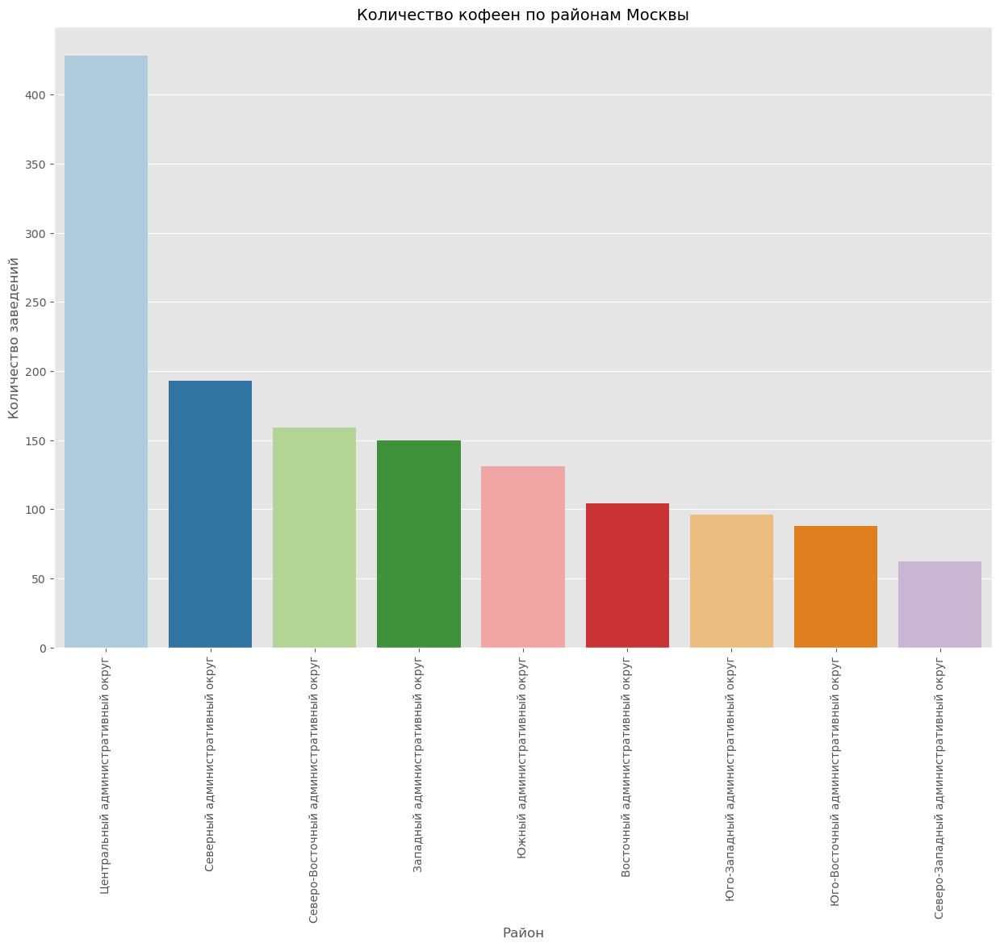

In [82]:
plt.figure(figsize=(15, 10))
sns.barplot(x='district', 
            y='count', 
            data=coffee_house_district) 
plt.title('Количество кофеен по районам Москвы', fontsize=14)
plt.xlabel('Район', fontsize=12)
plt.ylabel('Количество заведений', fontsize=12)
plt.xticks(rotation=90)

plt.show()

Посмотрим распределение кофеен по районам Москвы на карте.

In [83]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_house_district,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

# выводим карту
m

Большая часть кофеен находится в Центральном округе 30 %. От 10 до 14 % кофеен - в Северном, Северо-Восточном и Западном округах. В остальных районах от 4 до 9 % кофеен.

### Круглосуточные кофейни

Изучим круглосуточные кофейни.

In [84]:
print('Всего', coffee_house['is_24/7'].sum(), 'круглосуточных кофеен')

Всего 59 круглосуточных кофеен


In [85]:
print('{:.1%}'.format(len(coffee_house.query('hours == "ежедневно, круглосуточно"')) / len(coffee_house)), 'кофеен работают круглосуточно.')

4.2% кофеен работают круглосуточно.


### Рейтинги кофеен

Посмотрим распределение рейтингов кофеен по районам с помощью графиков boxplot.

In [86]:
coffee_house_middle_rating = coffee_house.groupby('district') \
                                         .agg(rating=('rating', 'median')) \
                                         .sort_values(by='rating', ascending=False) \
                                         .reset_index()

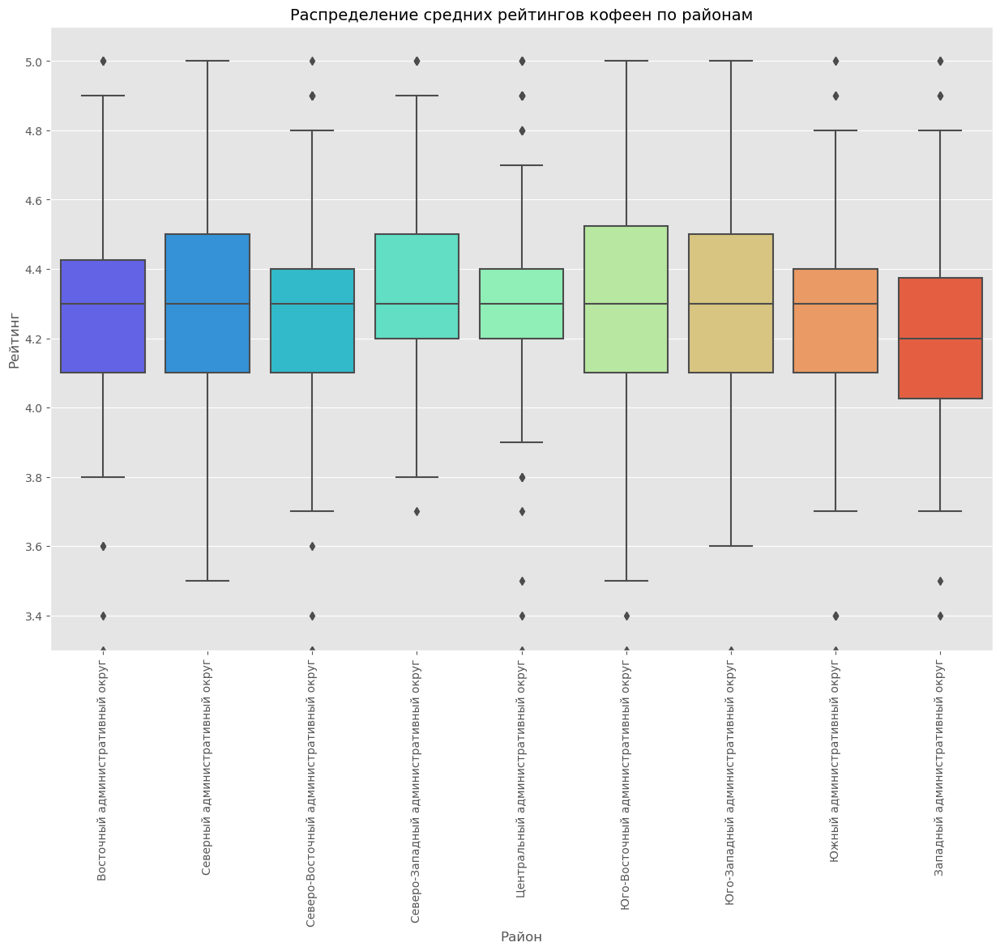

In [87]:
plt.figure(figsize=(15, 10))
sns.boxplot(x='district', 
            y='rating', 
            data=coffee_house, 
            order=coffee_house_middle_rating.district, 
            palette='rainbow')

plt.title('Распределение средних рейтингов кофеен по районам', fontsize=14)
plt.xlabel('Район', fontsize=12)
plt.ylabel('Рейтинг', fontsize=12)
plt.ylim(3.3, 5.1)
plt.xticks(rotation=90)
plt.show()

Медианные рейтинги кофеен не сильно отличаются по районам и составляют примерно 4.3. Наиболшая изменчивость рейтингов кофеен наблюдается в Северо-Восточном округе, наименьшая - в Юго-Западном округе.

### Стоимость чашки капучино

Посмотрим распределение медианной стоимости чашки капучино по районам

In [88]:
coffee_house_cup = coffee_house.query('middle_coffee_cup != 0') \
                                    .groupby('district') \
                                    .agg(median_middle_coffee_cup=('middle_coffee_cup', 'median')) \
                                    .sort_values(by='median_middle_coffee_cup', ascending=False) \
                                    .reset_index()
coffee_house_cup

,district,median_middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,145.0
8,Восточный административный округ,135.0


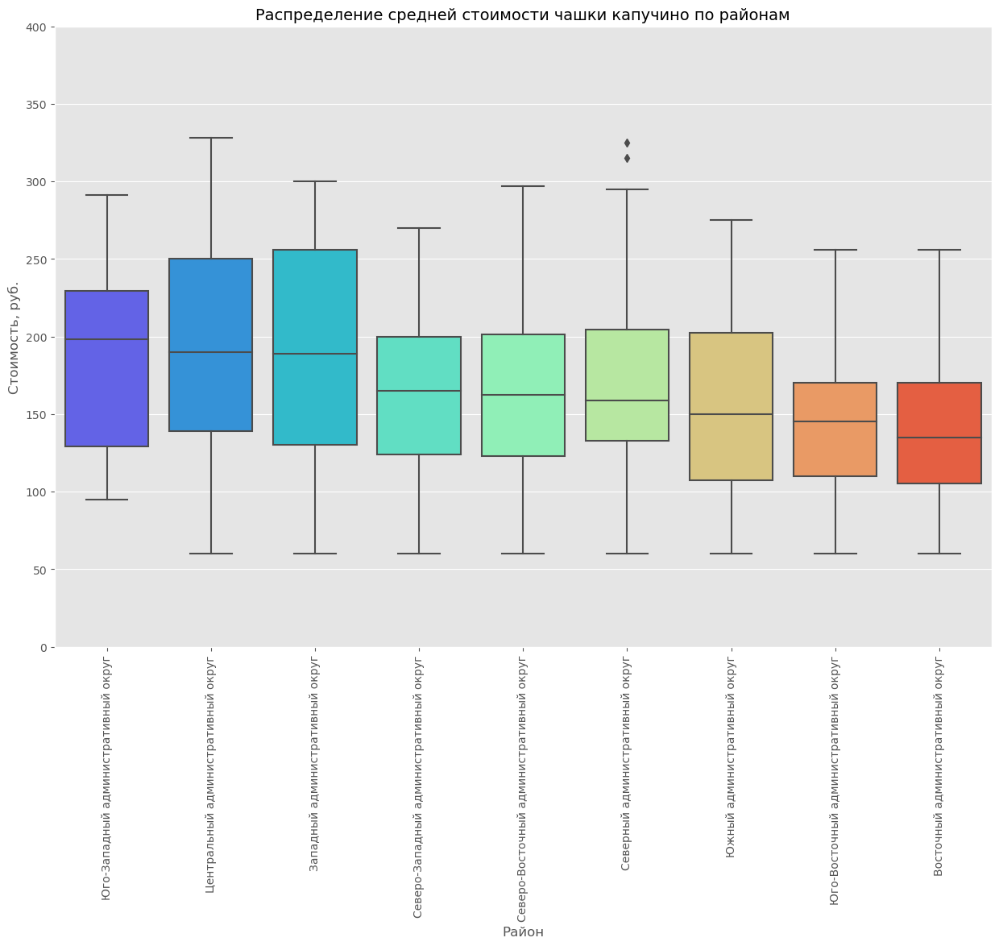

In [89]:
plt.figure(figsize=(15, 10))
sns.boxplot(x='district', 
            y='middle_coffee_cup', 
            data=coffee_house.query('middle_coffee_cup != 0'), 
            order=coffee_house_cup.district, 
            palette='rainbow')

plt.title('Распределение средней стоимости чашки капучино по районам', fontsize=14)
plt.xlabel('Район', fontsize=12)
plt.ylabel('Стоимость, руб.', fontsize=12)
plt.ylim(0, 400)
plt.xticks(rotation=90)

plt.show()

Самый дорогой капучино в кофейнях Юго-Западного округа - около 200 руб., на втором и третьем местах - кофейни Центрального и Западного округов - около 190 руб.. Самый дешёвый капучино в кофейнях Восточного округа - 135 руб..

## Рекомендации по предполагаемым местам расположения новых кофеен

* Наибольшее количество кофеен, что не удивительно, в центре Москвы, меньше всего их на северо-востоке. Если следовать принципу: чем больше заведений, тем выше спрос, то центр - идеальное место для открытия кофейни. Или же идти от обратного и открыть кафе в районе с дефицитом кофеен например в Юго-Западном округе. В этих районах и самая высокая стоимость чашки капучино. Если сделать цены более доступными, можно ожидать притока посетителей.
* В Юго-Западном довольно мало кофеен (около 7 % от общего числа кофеен), но при этом там продаётся самый дорогой кофе (200 руб. за чашку капучино).  Возможно, если открыть в этом округе кофейню с более низкими ценами, она будет пользоваться успехом.
* Очень мало круглосуточных кофеен в районе кроме центрального. Нет смысла искать персонал и оборудовать всё под круглосуточное заведение, так как конкурентного преимущества по сути это не даст. Люди, которые живут или ездят в центр ночью наверняка знают, что большая часть кофеен находится именно в центре. Если же открывать кофейню в центре, то здесь стоит учитывать тот факт, что ночью мало кто предпочтёт пить кофе. В основном все идёт в бары или рестораны. Поэтому даже в центре нет смысла открывать круглосуточную кофейню.
* Самые большие и самые низкие по рейтингам кофейни находятся в западном районе. Стоит избегать данный район, так как окрывать большую кофейню изначально - не очень хорошая идея, а низкие рейтинги могут привести к тому, что кофейня потеряет посетителей и разорится.
* Стоимость чашки капучино должна быть в среднем от 170 до 175 рублей. Такая цена позволит сохранять конкурентоспособность, так как она не будет в низком ценовом сигменте и не будет в высоком.

Презентация: <https://disk.yandex.ru/i/Ipboo8dT3tHOoQ> 